In [126]:
# !pip install plotly

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio
from scipy.fft import fft, fftfreq
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

In [55]:
# !ls /dev | grep tty
# to read data from flash
!bash get_wav_from_flash.sh 2
# Raw data: data/data_dump.bin
# Wav file: data/output.wav

Reading data from flash...
esptool -p /dev/tty.usbmodem202201 -b 2000000 read-flash 0x00410000 262144 data/data_dump2.bin
esptool v5.1.0
Serial port /dev/tty.usbmodem202201:
Connecting...
Detecting chip type... ESP32-S3
Connected to ESP32-S3 on /dev/tty.usbmodem202201:
Chip type:          ESP32-S3 (QFN56) (revision v0.2)
Features:           Wi-Fi, BT 5 (LE), Dual Core + LP Core, 240MHz, Embedded PSRAM 8MB (AP_3v3)
Crystal frequency:  40MHz
USB mode:           USB-Serial/JTAG
MAC:                74:4d:bd:89:74:ac

Uploading stub flasher...
Running stub flasher...
Stub flasher running.
Changing baud rate to 2000000...
Changed.

Configuring flash size...
Reading from 0x00450000 [==============================] 100.0% 262144/262144 bytes... 
Read 262144 bytes from 0x00410000 in 2.8 seconds (747.4 kbit/s) to 'data/data_dump2.bin'.

Hard resetting via RTS pin...
Converting to WAV...
python3 bin2wav.py data/data_dump2.bin data/output2.wav -c 2 -w 16 -r 16000 -C 0 
Розмір вхідного файлу: 26214

In [45]:
Audio(data='data/output.wav')

In [35]:
with open(raw_data_file, 'rb') as f:
    raw_data = f.read()
print([f'{raw_data[2*i]|(raw_data[2*i+1]<<8):04x}' for i in range(100)])

['00fe', '00c4', '00fb', '00c3', '00fb', '00c3', '00fb', '00c4', '00fb', '00c5', '00fc', '00c4', '00fc', '00c3', '00fd', '00c3', '00fd', '00c2', '00ff', '00c2', '00fe', '00c3', '00fd', '00c3', '00fd', '00c2', '00fc', '00c0', '00fc', '00bf', '00fa', '00bf', '00fb', '00c0', '00f7', '00be', '00f8', '00bd', '00f7', '00bc', '00f6', '00bc', '00f6', '00bb', '00f8', '00ba', '00f8', '00ba', '00f7', '00ba', '00f8', '00b9', '00f8', '00b9', '00f7', '00b9', '00f6', '00b8', '00f6', '00b8', '00f6', '00b7', '00f5', '00b7', '00f5', '00b7', '00f4', '00b8', '00f4', '00b7', '00f3', '00b7', '00f4', '00b5', '00f3', '00b5', '00f4', '00b6', '00f5', '00b4', '00f4', '00b5', '00f4', '00b4', '00f3', '00b4', '00f2', '00b4', '00f1', '00b4', '00f0', '00b3', '00ee', '00b3', '00ee', '00b4', '00ed', '00b2', '00ed', '00b2']


In [36]:
# ПРИМІТКА: для аудіо даних використовуйте int16 (signed), а не uint16 (unsigned)
# Це важливо, оскільки аудіо семпли можуть бути від'ємними
raw_data = np.fromfile(raw_data_file, dtype=np.int16).reshape(-1, 2)
raw_data_unsigned = np.fromfile(raw_data_file, dtype=np.uint16).reshape(-1, 2)
print("Перші 10 семплів (як hex):")
print([ f'{x:04x}' if x >= 0 else f'-{abs(x):04x}' for x in raw_data_unsigned.flatten()[:10] ])
print("\nПерші 10 семплів (як десяткові значення):")
print(raw_data[:5].tolist())

Перші 10 семплів (як hex):
['00fe', '00c4', '00fb', '00c3', '00fb', '00c3', '00fb', '00c4', '00fb', '00c5']

Перші 10 семплів (як десяткові значення):
[[254, 196], [251, 195], [251, 195], [251, 196], [251, 197]]


In [37]:
# Завантаження бінарних даних як signed 16-bit integers
raw_data_file = 'data/data_dump.bin'

# Читаємо дані як signed 16-bit integers (little-endian)
# Формат: інтерлівовані канали [L0, R0, L1, R1, L2, R2, ...]
audio_data = np.fromfile(raw_data_file, dtype=np.int16)

print("=== ПОЯСНЕННЯ: РЯДКИ vs СТОВПЦІ ===\n")
print(f"Вихідні дані (перші 10 семплів): {audio_data[:10]}")
print(f"Форма: {audio_data.shape}  (1D масив)\n")

# ВАРІАНТ 1: reshape(-1, 2) - N рядків, 2 стовпці
# Структура: кожен РЯДОК містить пару [L, R]
stereo_channels_rows = audio_data.reshape(-1, 2)
print("ВАРІАНТ 1: reshape(-1, 2)")
print(f"  Форма: {stereo_channels_rows.shape}  (N рядків × 2 стовпці)")
print(f"  Перші 3 рядки:\n{stereo_channels_rows[:3]}")
print(f"  Індексація:")
print(f"    stereo_channels_rows[0] = {stereo_channels_rows[0]}  # Перший рядок [L0, R0]")
print(f"    stereo_channels_rows[:, 0] = {stereo_channels_rows[:5, 0]}  # Перший СТОВПЕЦЬ (лівий канал)")
print(f"    stereo_channels_rows[:, 1] = {stereo_channels_rows[:5, 1]}  # Другий СТОВПЕЦЬ (правий канал)\n")

# ВАРІАНТ 2: reshape(2, -1) - 2 рядки, N стовпців
# Структура: перший РЯДОК = лівий канал, другий РЯДОК = правий канал
stereo_channels_cols = audio_data.reshape(2, -1)
print("ВАРІАНТ 2: reshape(2, -1)")
print(f"  Форма: {stereo_channels_cols.shape}  (2 рядки × N стовпців)")
print(f"  Перший рядок (лівий канал): {stereo_channels_cols[0, :5]}")
print(f"  Другий рядок (правий канал): {stereo_channels_cols[1, :5]}")
print(f"  Індексація:")
print(f"    stereo_channels_cols[0] = {stereo_channels_cols[0, :5]}  # Перший РЯДОК (лівий канал)")
print(f"    stereo_channels_cols[1] = {stereo_channels_cols[1, :5]}  # Другий РЯДОК (правий канал)\n")

print("=== РЕКОМЕНДОВАНИЙ ВАРІАНТ ===")
print("Для стерео аудіо зручніше використовувати reshape(-1, 2).T:")
print(f"  це означає, що у нас дані йдуть в такому порядку: L0, R0, L1, R1, L2, R2, ... (N рядків × 2 стовпці)")
print(f"  але робимо трансфонування, і отримуємо 2 рядки, і в кожному рядку N семплів, що зручно для подальшої роботи")
print("  - stereo_channels_cols[0] = весь лівий канал")
print("  - stereo_channels_cols[1] = весь правий канал")

# Використовуємо варіант 2 для подальшої роботи
stereo_channels = audio_data.reshape(-1, 2).T
max_stereo = np.max(np.abs(stereo_channels))

print(f"\nЗагальна кількість каналів: {len(stereo_channels)}")
print(f"Кількість семплів на канал: {len(stereo_channels[0])}")
print(f"Максимальне значення стерео масиву: {max_stereo} (для нормалізації)")

=== ПОЯСНЕННЯ: РЯДКИ vs СТОВПЦІ ===

Вихідні дані (перші 10 семплів): [254 196 251 195 251 195 251 196 251 197]
Форма: (131072,)  (1D масив)

ВАРІАНТ 1: reshape(-1, 2)
  Форма: (65536, 2)  (N рядків × 2 стовпці)
  Перші 3 рядки:
[[254 196]
 [251 195]
 [251 195]]
  Індексація:
    stereo_channels_rows[0] = [254 196]  # Перший рядок [L0, R0]
    stereo_channels_rows[:, 0] = [254 251 251 251 251]  # Перший СТОВПЕЦЬ (лівий канал)
    stereo_channels_rows[:, 1] = [196 195 195 196 197]  # Другий СТОВПЕЦЬ (правий канал)

ВАРІАНТ 2: reshape(2, -1)
  Форма: (2, 65536)  (2 рядки × N стовпців)
  Перший рядок (лівий канал): [254 196 251 195 251]
  Другий рядок (правий канал): [80 80 82 80 83]
  Індексація:
    stereo_channels_cols[0] = [254 196 251 195 251]  # Перший РЯДОК (лівий канал)
    stereo_channels_cols[1] = [80 80 82 80 83]  # Другий РЯДОК (правий канал)

=== РЕКОМЕНДОВАНИЙ ВАРІАНТ ===
Для стерео аудіо зручніше використовувати reshape(-1, 2).T:
  це означає, що у нас дані йдуть в такому п

In [38]:
# Scale to float32
stereo_channels_normalized = stereo_channels.astype(np.float32) / max_stereo

max_stereo_scaled = [ np.min(stereo_channels_normalized), np.max(stereo_channels_normalized) ]
print(f"Діапазон стерео масиву: {max_stereo_scaled}")
print(f"\nПорівняння каналів:")
print(f"  Лівий канал - макс: {np.max((stereo_channels_normalized[0]))}")
print(f"  Лівий канал - мін: {np.min((stereo_channels_normalized[0]))}")
print(f"  Правий канал - макс: {np.max((stereo_channels_normalized[1]))}")
print(f"  Правий канал - мін: {np.min((stereo_channels_normalized[1]))}")

Діапазон стерео масиву: [np.float32(-0.915942), np.float32(1.0)]

Порівняння каналів:
  Лівий канал - макс: 1.0
  Лівий канал - мін: -0.9159420132637024
  Правий канал - макс: 0.8898550868034363
  Правий канал - мін: -0.8724637627601624


In [39]:
# Параметри аудіо
sample_rate = 16000  # Гц
duration = len(stereo_channels_normalized[0]) / sample_rate

print(f"Тривалість: {duration:.2f} секунд")
print(f"Форма стерео масиву: {stereo_channels_normalized.shape}")
print(f"Кількість семплів: Лівий канал - {len(stereo_channels_normalized[0])}, Правий канал - {len(stereo_channels_normalized[1])}")
print(f"Тип даних: {stereo_channels_normalized.dtype}")

Тривалість: 4.10 секунд
Форма стерео масиву: (2, 65536)
Кількість семплів: Лівий канал - 65536, Правий канал - 65536
Тип даних: float32


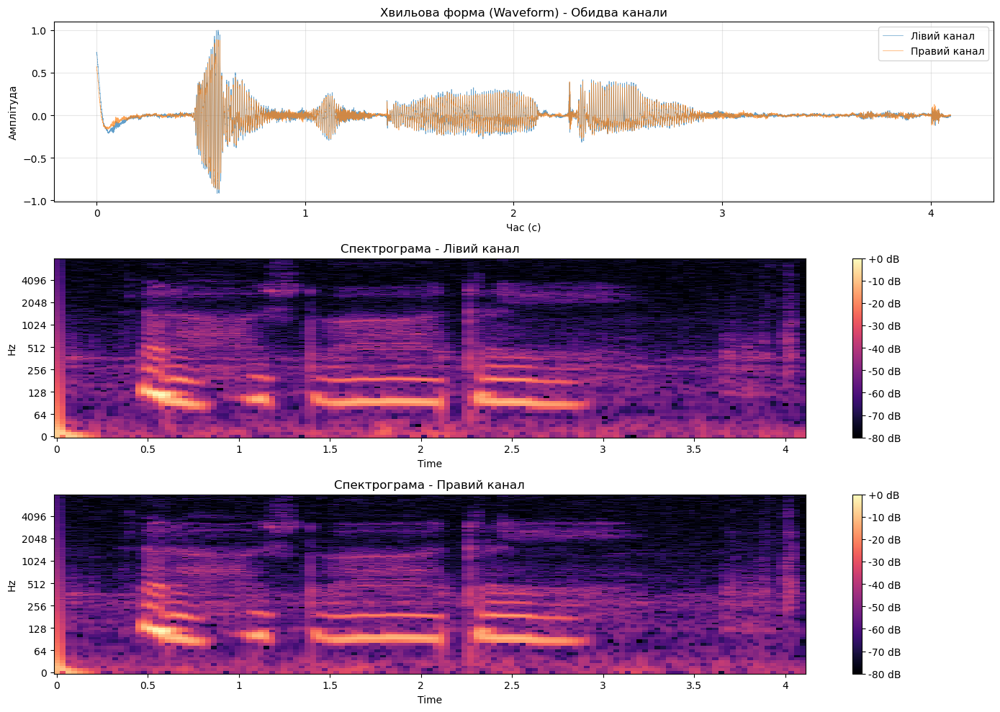

In [40]:
# Візуалізація стерео аудіо
fig, axes = plt.subplots(3, 1, figsize=(14, 10))

# 1. Хвильова форма обох каналів
time_axis = np.arange(len(stereo_channels_normalized[0])) / sample_rate

axes[0].plot(time_axis, stereo_channels_normalized[0], label='Лівий канал', alpha=0.7, linewidth=0.5)
axes[0].plot(time_axis, stereo_channels_normalized[1], label='Правий канал', alpha=0.7, linewidth=0.5)
axes[0].set_xlabel('Час (с)')
axes[0].set_ylabel('Амплітуда')
axes[0].set_title('Хвильова форма (Waveform) - Обидва канали')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# 2. Спектрограма лівого каналу
D_left = librosa.stft(stereo_channels_normalized[0])
S_db_left = librosa.amplitude_to_db(np.abs(D_left), ref=np.max)
# specshow() повертає AxesImage об'єкт, який потрібно використовувати для colorbar
img_left = librosa.display.specshow(S_db_left, sr=sample_rate, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title('Спектрограма - Лівий канал')
plt.colorbar(img_left, ax=axes[1], format='%+2.0f dB')

# 3. Спектрограма правого каналу
D_right = librosa.stft(stereo_channels_normalized[1])
S_db_right = librosa.amplitude_to_db(np.abs(D_right), ref=np.max)
img_right = librosa.display.specshow(S_db_right, sr=sample_rate, x_axis='time', y_axis='log', ax=axes[2])
axes[2].set_title('Спектрограма - Правий канал')
plt.colorbar(img_right, ax=axes[2], format='%+2.0f dB')

plt.tight_layout()
plt.show()

In [41]:
# ІНТЕРАКТИВНА ВІЗУАЛІЗАЦІЯ З PLOTLY
# Plotly дозволяє: скролити, зум, додавати мітки, експортувати графіки

# Для великих файлів - зменшуємо кількість точок для швидшого відображення
# (Plotly може працювати з мільйонами точок, але для інтерактивності краще зменшити)
max_points = 50000  # Максимум точок для відображення
if len(stereo_channels_normalized[0]) > max_points:
    step = len(stereo_channels_normalized[0]) // max_points
    time_axis_downsampled = time_axis[::step]
    channel_left_downsampled = stereo_channels_normalized[0][::step]
    channel_right_downsampled = stereo_channels_normalized[1][::step]
    print(f"Дані зменшено з {len(time_axis)} до {len(time_axis_downsampled)} точок для швидшого відображення")
else:
    time_axis_downsampled = time_axis
    channel_left_downsampled = stereo_channels_normalized[0]
    channel_right_downsampled = stereo_channels_normalized[1]

# Створюємо інтерактивний графік
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Лівий канал', 'Правий канал'),
    vertical_spacing=0.1,
    shared_xaxes=True
)

# Додаємо лівий канал
fig.add_trace(
    go.Scatter(
        x=time_axis_downsampled,
        y=channel_left_downsampled,
        mode='lines',
        name='Лівий канал',
        line=dict(color='blue', width=1),
        hovertemplate='<b>Лівий канал</b><br>Час: %{x:.3f} с<br>Амплітуда: %{y:.4f}<extra></extra>'
    ),
    row=1, col=1
)

# Додаємо правий канал
fig.add_trace(
    go.Scatter(
        x=time_axis_downsampled,
        y=channel_right_downsampled,
        mode='lines',
        name='Правий канал',
        line=dict(color='red', width=1),
        hovertemplate='<b>Правий канал</b><br>Час: %{x:.3f} с<br>Амплітуда: %{y:.4f}<extra></extra>'
    ),
    row=2, col=1
)

# Налаштування осей
fig.update_xaxes(title_text="Час (с)", row=2, col=1)
fig.update_yaxes(title_text="Амплітуда", row=1, col=1)
fig.update_yaxes(title_text="Амплітуда", row=2, col=1)

# Загальні налаштування
fig.update_layout(
    title={
        'text': 'Інтерактивна хвильова форма стерео аудіо',
        'x': 0.5,
        'xanchor': 'center'
    },
    height=800,
    hovermode='x unified',
    showlegend=True,
    # Додаємо кнопки для зуму та інших функцій
    xaxis_rangeslider_visible=False,
    # Додаємо режим малювання (для додавання міток)
    dragmode='pan',  # 'pan', 'zoom', 'select', 'lasso'
)

# Відображаємо графік
fig.show()

print("\n💡 Інтерактивні можливості:")
print("  • Скрол колесом миші = зум")
print("  • Перетягування = панорама")
print("  • Подвійний клік = автозум")
print("  • Кнопка 'Box Select' = виділення області")
print("  • Кнопка 'Lasso Select' = виділення довільної форми")
print("  • Кнопка 'Download plot as png' = збереження графіка")
print("  • Hover = показ значень у точці")


Дані зменшено з 65536 до 65536 точок для швидшого відображення



💡 Інтерактивні можливості:
  • Скрол колесом миші = зум
  • Перетягування = панорама
  • Подвійний клік = автозум
  • Кнопка 'Box Select' = виділення області
  • Кнопка 'Lasso Select' = виділення довільної форми
  • Кнопка 'Download plot as png' = збереження графіка
  • Hover = показ значень у точці


In [42]:
# ІНТЕРАКТИВНА ХВИЛЬОВА ФОРМА - ОБИДВА КАНАЛИ НА ОДНОМУ ГРАФІКУ
# Той самий стиль, але обидва сигнали на одному полі для порівняння

# Використовуємо ті самі дані (вже зменшені в попередній комірці)
# Якщо ця комірка запускається окремо, потрібно переконатися, що змінні існують
def drow_waveform_2signals(signal_1, signal_2, name_1, name_2):
    if 'time_axis_downsampled' not in locals():
        max_points = 50000
        if len(signal_1) > max_points:
            step = len(signal_1) // max_points
            time_axis_downsampled = time_axis[::step]
            channel_left_downsampled = signal_1[::step]
            channel_right_downsampled = signal_2[::step]
            print(f"Дані зменшено з {len(time_axis)} до {len(time_axis_downsampled)} точок для швидшого відображення")
        else:
            time_axis_downsampled = time_axis
            channel_left_downsampled = signal_1
            channel_right_downsampled = signal_2

    # Створюємо один графік (не subplots)
    fig_combined = go.Figure()

    hover_signal_1 = f'<b>{name_1}</b><br>Час: '
    hover_signal_2 = f'<b>{name_2}</b><br>Час: '

    # Додаємо signal_1
    fig_combined.add_trace(
        go.Scatter(
            x=time_axis_downsampled,
            y=channel_left_downsampled,
            mode='lines',
            name=name_1,
            line=dict(color='blue', width=1.5),
            hovertemplate=hover_signal_1+'%{x:.3f} с<br>Амплітуда: %{y:.4f}<extra></extra>'
        )
    )

    # Додаємо signal_2 на той самий графік
    fig_combined.add_trace(
        go.Scatter(
            x=time_axis_downsampled,
            y=channel_right_downsampled,
            mode='lines',
            name=name_2,
            line=dict(color='red', width=1.5),
            hovertemplate=hover_signal_2+'%{x:.3f} с<br>Амплітуда: %{y:.4f}<extra></extra>'
        )
    )

    # Налаштування осей та загальні налаштування
    fig_combined.update_layout(
        title={
            'text': 'Інтерактивна хвильова форма стерео аудіо (обидва канали на одному графіку)',
            'x': 0.5,
            'xanchor': 'center'
        },
        xaxis_title='Час (с)',
        yaxis_title='Амплітуда',
        height=600,
        hovermode='x unified',
        showlegend=True,
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01
        ),
        # Додаємо кнопки для зуму та інших функцій
        xaxis_rangeslider_visible=False,
        # Додаємо режим малювання (для додавання міток)
        dragmode='pan',  # 'pan', 'zoom', 'select', 'lasso'
    )

    # Відображаємо графік
    fig_combined.show()

drow_waveform_2signals(stereo_channels_normalized[0], stereo_channels_normalized[1], 'Лівий канал', 'Правий канал')


print("\n💡 Інтерактивні можливості:")
print("  • Скрол колесом миші = зум")
print("  • Перетягування = панорама")
print("  • Подвійний клік = автозум")
print("  • Кнопка 'Box Select' = виділення області")
print("  • Кнопка 'Lasso Select' = виділення довільної форми")
print("  • Кнопка 'Download plot as png' = збереження графіка")
print("  • Hover = показ значень у точці")
print("  • Легенда: клік для показу/приховування каналів")


Дані зменшено з 65536 до 65536 точок для швидшого відображення



💡 Інтерактивні можливості:
  • Скрол колесом миші = зум
  • Перетягування = панорама
  • Подвійний клік = автозум
  • Кнопка 'Box Select' = виділення області
  • Кнопка 'Lasso Select' = виділення довільної форми
  • Кнопка 'Download plot as png' = збереження графіка
  • Hover = показ значень у точці
  • Легенда: клік для показу/приховування каналів


In [140]:
# ІНТЕРАКТИВНА СПЕКТРОГРАМА З PLOTLY
# Створюємо спектрограму з можливістю зуму та навігації

def drow_spectrogram(signal_1, signal_2, name_1, name_2):

    # Обчислюємо STFT для обох каналів
    D_left = librosa.stft(signal_1)
    D_right = librosa.stft(signal_2)

    # Конвертуємо в dB
    S_db_left = librosa.amplitude_to_db(np.abs(D_left), ref=np.max)
    S_db_right = librosa.amplitude_to_db(np.abs(D_right), ref=np.max)

    # Отримуємо часові та частотні осі
    times_left = librosa.frames_to_time(np.arange(S_db_left.shape[1]), sr=sample_rate)
    freqs_left = librosa.fft_frequencies(sr=sample_rate)

    times_right = librosa.frames_to_time(np.arange(S_db_right.shape[1]), sr=sample_rate)
    freqs_right = librosa.fft_frequencies(sr=sample_rate)

    # Створюємо інтерактивну спектрограму
    fig_spec = make_subplots(
        rows=2, cols=1,
        subplot_titles=(f'Спектрограма - {name_1}', f'Спектрограма - {name_2}'),
        vertical_spacing=0.1,
        shared_xaxes=True,
        specs=[[{"type": "heatmap"}], [{"type": "heatmap"}]]
    )

    hover_signal_1 = f'<b>{name_1}</b><br>Час: '
    hover_signal_2 = f'<b>{name_2}</b><br>Час: '

    # Лівий канал
    fig_spec.add_trace(
        go.Heatmap(
            z=S_db_left,
            x=times_left,
            y=freqs_left,
            colorscale='Viridis',
            colorbar=dict(title="dB", len=0.4, y=0.75),
            hovertemplate=hover_signal_1+'%{x:.3f} с<br>Частота: %{y:.1f} Гц<br>Амплітуда: %{z:.1f} dB<extra></extra>',
            name='Лівий'
        ),
        row=1, col=1
    )

    # Правий канал
    fig_spec.add_trace(
        go.Heatmap(
            z=S_db_right,
            x=times_right,
            y=freqs_right,
            colorscale='Viridis',
            colorbar=dict(title="dB", len=0.4, y=0.25),
            hovertemplate=hover_signal_2+'%{x:.3f} с<br>Частота: %{y:.1f} Гц<br>Амплітуда: %{z:.1f} dB<extra></extra>',
            name='Правий'
        ),
        row=2, col=1
    )

    # Налаштування осей
    fig_spec.update_xaxes(title_text="Час (с)", row=2, col=1)
    fig_spec.update_yaxes(title_text="Частота (Гц)", type="log", row=1, col=1)
    fig_spec.update_yaxes(title_text="Частота (Гц)", type="log", row=2, col=1)

    # Загальні налаштування
    fig_spec.update_layout(
        title={
            'text': 'Інтерактивна спектрограма стерео аудіо',
            'x': 0.5,
            'xanchor': 'center'
        },
        height=800,
        hovermode='closest'
    )

    fig_spec.show()

drow_spectrogram(stereo_channels_normalized[0], stereo_channels_normalized[1], 'Лівий канал', 'Правий канал')

print("\n💡 Спектрограма підтримує:")
print("  • Зум по обох осях (час та частота)")
print("  • Панорама перетягуванням")
print("  • Hover для перегляду точних значень")
print("  • Експорт у PNG/SVG")



💡 Спектрограма підтримує:
  • Зум по обох осях (час та частота)
  • Панорама перетягуванням
  • Hover для перегляду точних значень
  • Експорт у PNG/SVG


In [134]:
# ДОДАВАННЯ МІТОК ТА АНОТАЦІЙ НА ГРАФІК
# Приклад: додавання міток у важливих точках сигналу

# Знаходимо піки в сигналі (приклад)
from scipy.signal import find_peaks

# Знаходимо піки в лівому каналі
peaks_left, properties_left = find_peaks(
    np.abs(channel_left_downsampled), 
    height=np.max(np.abs(channel_left_downsampled)) * 0.5,
    distance=int(sample_rate * 0.1)  # Мінімальна відстань між піками
)

# Створюємо графік з мітками
fig_annotated = go.Figure()

# Додаємо сигнал
fig_annotated.add_trace(go.Scatter(
    x=time_axis_downsampled,
    y=channel_left_downsampled,
    mode='lines',
    name='Лівий канал',
    line=dict(color='blue', width=1)
))

# Додаємо мітки на піки
if len(peaks_left) > 0:
    peak_times = time_axis_downsampled[peaks_left]
    peak_values = channel_left_downsampled[peaks_left]
    
    fig_annotated.add_trace(go.Scatter(
        x=peak_times,
        y=peak_values,
        mode='markers+text',
        name='Піки',
        marker=dict(
            size=10,
            color='red',
            symbol='triangle-up'
        ),
        text=[f'Пік {i+1}' for i in range(len(peaks_left))],
        textposition='top center',
        hovertemplate='<b>Пік</b><br>Час: %{x:.3f} с<br>Амплітуда: %{y:.4f}<extra></extra>'
    ))

# Додаємо вертикальні лінії для важливих моментів (приклад)
important_times = [0.5, 1.0, 2.0]  # Можна змінити на ваші моменти
for t in important_times:
    if t < time_axis_downsampled[-1]:
        fig_annotated.add_vline(
            x=t,
            line_dash="dash",
            line_color="green",
            annotation_text=f"Мітка {t:.1f}s",
            annotation_position="top"
        )

fig_annotated.update_layout(
    title='Хвильова форма з мітками та анотаціями',
    xaxis_title='Час (с)',
    yaxis_title='Амплітуда',
    height=600,
    hovermode='x unified'
)

fig_annotated.show()

print(f"\nЗнайдено {len(peaks_left)} піків у лівому каналі")
print("💡 Можна додавати:")
print("  • Вертикальні лінії (add_vline)")
print("  • Горизонтальні лінії (add_hline)")
print("  • Текстові анотації (add_annotation)")
print("  • Фігури (add_shape)")



Знайдено 8 піків у лівому каналі
💡 Можна додавати:
  • Вертикальні лінії (add_vline)
  • Горизонтальні лінії (add_hline)
  • Текстові анотації (add_annotation)
  • Фігури (add_shape)


In [ ]:
# Знаходимо суму двох каналів
stereo_sum = stereo_channels_normalized[0] + stereo_channels_normalized[1]

# Візуалізуємо суму двох каналів
drow_waveform_2signals(stereo_channels_normalized[0], stereo_sum, 'Лівий канал', 'Сума лівого та правого каналів')

Дані зменшено з 65536 до 65536 точок для швидшого відображення


In [141]:
drow_spectrogram(stereo_channels_normalized[0], stereo_sum, 'Лівий канал', 'Сума лівого та правого каналів')

In [120]:
# Альтернативний спосіб: використання librosa для завантаження WAV файлу
# (якщо потрібно порівняти з вже конвертованим файлом)
wav_file = 'data/output.wav'
audio_librosa, sr_librosa = librosa.load(wav_file, sr=None, mono=False)

print(f"Завантажено через librosa:")
print(f"  Форма: {audio_librosa.shape}")
print(f"  Частота семплювання: {sr_librosa} Гц")
print(f"  Тип: {audio_librosa.dtype}")

# Порівняння з бінарними даними
if audio_librosa.shape[0] == 2:
    print(f"\nПорівняння каналів:")
    print(f"  Лівий канал  - макс: {np.max((audio_librosa[0]))}")
    print(f"  Лівий канал  - мін: {np.min((audio_librosa[0]))}")
    print(f"  Правий канал - макс: {np.max((audio_librosa[1]))}")
    print(f"  Правий канал - мін: {np.min((audio_librosa[1]))}")

Завантажено через librosa:
  Форма: (2, 65536)
  Частота семплювання: 16000 Гц
  Тип: float32

Порівняння каналів:
  Лівий канал  - макс: 0.909332275390625
  Лівий канал  - мін: -0.76519775390625
  Правий канал - макс: 0.999969482421875
  Правий канал - мін: -0.733978271484375


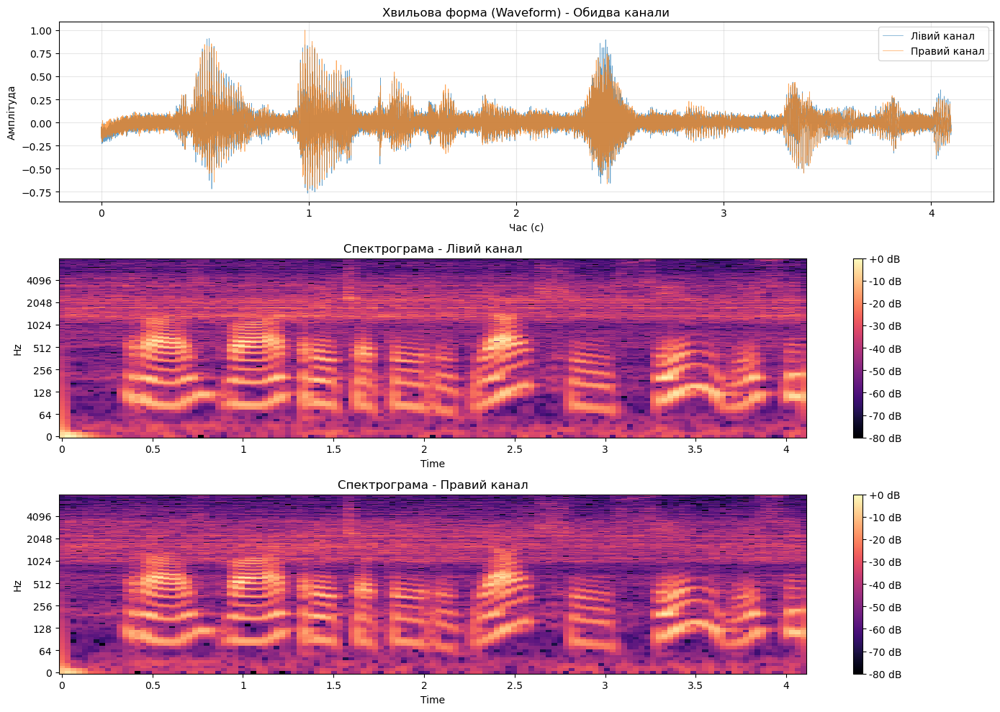

In [115]:
# Візуалізація wav файлу
fig, axes = plt.subplots(3, 1, figsize=(14, 10))

# 1. Хвильова форма обох каналів
time_axis = np.arange(len(audio_librosa[0])) / sample_rate

axes[0].plot(time_axis, audio_librosa[0], label='Лівий канал', alpha=0.7, linewidth=0.5)
axes[0].plot(time_axis, audio_librosa[1], label='Правий канал', alpha=0.7, linewidth=0.5)
axes[0].set_xlabel('Час (с)')
axes[0].set_ylabel('Амплітуда')
axes[0].set_title('Хвильова форма (Waveform) - Обидва канали')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# 2. Спектрограма лівого каналу
D_left = librosa.stft(audio_librosa[0])
S_db_left = librosa.amplitude_to_db(np.abs(D_left), ref=np.max)
# specshow() повертає AxesImage об'єкт, який потрібно використовувати для colorbar
img_left = librosa.display.specshow(S_db_left, sr=sample_rate, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title('Спектрограма - Лівий канал')
plt.colorbar(img_left, ax=axes[1], format='%+2.0f dB')

# 3. Спектрограма правого каналу
D_right = librosa.stft(audio_librosa[1])
S_db_right = librosa.amplitude_to_db(np.abs(D_right), ref=np.max)
img_right = librosa.display.specshow(S_db_right, sr=sample_rate, x_axis='time', y_axis='log', ax=axes[2])
axes[2].set_title('Спектрограма - Правий канал')
plt.colorbar(img_right, ax=axes[2], format='%+2.0f dB')

plt.tight_layout()
plt.show()